## The goal is to prepare the data in our /videos with labels_dataframe.csv to make it ready for finetuning Faster-R CNN

we first take a look at how faster r-cnn finetune data is structered

In [3]:
%pip install pycocotools
%pip install scikit-learn

import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import models, transforms
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
import kagglehub
import shutil
from sklearn.model_selection import train_test_split
import json



c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


we can go for the coco json annotation:
```dataset/
├── train/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   └── annotations/
│       └── instances_train.json
├── val/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   └── annotations/
│       └── instances_val.json

Sample COCO JSON annotation for one image:
{
    "images": [
        {"id": 1, "file_name": "image1.jpg", "height": 480, "width": 640},
        
    ],
    "annotations": [
        {"id": 1, "image_id": 1, "category_id": 1, "bbox": [100, 200, 50, 50], "area": 2500, "iscrowd": 0}
    ],
    "categories": [
        {"id": 1, "name": "object_class"}
    ]
}


or the Pascal VOC Format:
dataset/
├── train/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   ├── annotations/
│       ├── image1.xml
│       ├── image2.xml

Sample XML annotation for one image:
<annotation>
    <folder>images</folder>
    <filename>image1.jpg</filename>
    <size>
        <width>640</width>
        <height>480</height>
    </size>
    <object>
        <name>object_class</name>
        <bndbox>
            <xmin>100</xmin>
            <ymin>200</ymin>
            <xmax>150</xmax>
            <ymax>250</ymax>
        </bndbox>
    </object>
</annotation>```


Right now the data looks like this:

In [4]:
df = pd.read_csv('data/labels_dataframe.csv')
df.head(20)

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN
5,138,Task1,133,1690279852.mp4,730,59,59,302.70,496.68,460.59,544.77,83/2789,NaN
6,138,Task1,133,1690279852.mp4,730,60,60,363.79,494.68,521.09,542.78,83/2789,NaN
7,138,Task1,133,1690279852.mp4,730,61,61,424.87,492.68,581.58,540.78,83/2789,NaN
8,138,Task1,133,1690279852.mp4,730,62,62,485.95,490.69,642.08,538.78,83/2789,NaN
9,138,Task1,133,1690279852.mp4,730,63,63,547.03,488.69,702.57,536.78,83/2789,NaN


The columns we need for COCO are:

images:
- ID
- File name
- height/width of the picture

annotations:
- ID
- Image_id
- category ID
- bounding box (coordinates)
- area (oppervlakte van bounding box)
- iscrowd (used to indicate whether an object is part of a "crowd" or a group of objects that cannot be easily separated)

categories:
- ID
- Category class (string)

We have all of these classes we just need to format them, except for the file_name but we can get this by loading the video and then get the frame of that video and then get the video file addressed to this

### Let's see what we need to do in order to fine tune Faster R-CNN

In [3]:
# Load pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the classifier for custom classes
num_classes = 2  # 1 class + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Dataset and DataLoader
train_dataset = CocoDetection(root='dataset/train/images',
                              annFile='dataset/train/annotations/instances_train.json',
                              transform=transforms.ToTensor())

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training Loop
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

for epoch in range(10):
    model.train()
    for images, targets in train_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f"Epoch {epoch}, Loss: {losses.item()}")


c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ModuleNotFoundError: No module named 'pycocotools'

We already have some images on Kaggle:

In [7]:
path = kagglehub.dataset_download("stanislavlevendeev/hazmat-detection")


In [8]:
path

'C:\\Users\\ewald\\.cache\\kagglehub\\datasets\\stanislavlevendeev\\hazmat-detection\\versions\\11'

In [5]:
df.head()

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN


In [12]:
# frames available
frames_path = os.listdir(path+'/yolo/images/test')

In [13]:
# print all the filenames in the folder
print(frames_path)
print(len(frames_path))

['1690281365_00587.jpg', '1690281365_00588.jpg', '1690281365_00589.jpg', '1690281365_00590.jpg', '1690281365_00591.jpg', '1690281365_00592.jpg', '1690281365_00593.jpg', '1690281365_00594.jpg', '1690281365_00595.jpg', '1690281365_00596.jpg', '1690281365_00597.jpg', '1690281365_00598.jpg', '1690281365_00599.jpg', '1690281365_00600.jpg', '1690281365_00601.jpg', '1690281365_00602.jpg', '1690281365_00603.jpg', '1690281365_00604.jpg', '1690281365_00605.jpg', '1690281365_00606.jpg', '1690281365_00607.jpg', '1690281365_00608.jpg', '1690281365_00609.jpg', '1690281365_00610.jpg', '1690281365_00611.jpg', '1690281365_00612.jpg', '1690281365_00613.jpg', '1690281365_00614.jpg', '1690281365_00615.jpg', '1690281365_00616.jpg', '1690281365_00617.jpg', '1690281365_00618.jpg', '1690281365_00619.jpg', '1690281365_00620.jpg', '1690281365_00621.jpg', '1690281365_00622.jpg', '1690281365_00623.jpg', '1690281365_00624.jpg', '1690281365_00625.jpg', '1690281365_00626.jpg', '1690281365_00627.jpg', '1690281365_006

In [20]:
# get the rows from df that are in frames_path and make this into a new df

# create a new df
df_available = pd.DataFrame(columns=df.columns)

for i in range(len(frames_path)):
    file_name = frames_path[i]
    # Get the last part of the filename after splitting to "_"
    file_parts = file_name.split("_")

    first_part = file_parts[0]
    last_part = file_parts[-1]
    # Split the last part further at the point (".") and extract the first value
    frame_str = last_part.split(".")[0]
    frame_str = str(frame_str).lstrip("0") if frame_str != 0 else "0"
    # Filter rows in the original DataFrame
    matching_rows = df[
        (df["Source"] == f"{first_part}.mp4") &
        (df["Relative Frame"] == int(frame_str))
    ]
    
    # Append matching rows to df_available
    df_available = pd.concat([df_available, matching_rows], ignore_index=True)

df_available.head()

# then we create the annotations and we get the associated images

C:\Users\ewald\AppData\Local\Temp\ipykernel_28120\3603824316.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_available = pd.concat([df_available, matching_rows], ignore_index=True)


,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,142,"{task2, task3}",138,1690281365.mp4,733,1317,587,1539.2,517.89,1667.96,594.60,23/1969,NaN
1,142,"{task2, task3}",138,1690281365.mp4,733,1318,588,1553.3,517.28,1681.59,593.90,23/1969,NaN
2,142,"{task2, task3}",138,1690281365.mp4,733,1319,589,1567.4,516.67,1695.22,593.20,23/1969,NaN
3,142,"{task2, task3}",138,1690281365.mp4,733,1320,590,1581.5,516.05,1708.86,592.50,23/1969,NaN
4,142,"{task2, task3}",138,1690281365.mp4,733,1321,591,1595.6,515.44,1722.49,591.81,23/1969,NaN


In [22]:
print(len(df_available))

21


In [21]:
# this df_available will be split in test, train, val

# Define split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Step 1: Split into train and temp (combined val and test)
train, temp = train_test_split(df_available, test_size=(val_ratio + test_ratio), random_state=42)

# Step 2: Split temp into validation and test
val, test = train_test_split(temp, test_size=(test_ratio / (val_ratio + test_ratio)), random_state=42)

# Verify the splits
print(f"Training set: {len(train)} rows")
print(f"Validation set: {len(val)} rows")
print(f"Test set: {len(test)} rows")


  Using cached scipy-1.14.1-cp310-cp310-win_amd64.whl.metadata (60 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
   ------- -------------------------------- 2.1/11.1 MB 10.7 MB/s eta 0:00:01
   ---------------- ----------------------- 4.7/11.1 MB 11.4 MB/s eta 0:00:01
   --------------------------- ------------ 7.6/11.1 MB 12.4 MB/s eta 0:00:01
   ---------------------------------------  11.0/11.1 MB 13.2 MB/s eta 0:00:01
   ---------------------------------------- 11.1/11.1 MB 12.9 MB/s eta 0:00:00
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
Using cached scipy-1.14.1-cp310-cp310-win_amd64.whl (44.8 MB)
Using cached threadpoolctl-3.5.0-py3-none-any.whl (18 kB)
Note: you may need to restart the kernel to use updated packages.
Training set: 14 rows
Validation set: 3 rows
Test set: 4 rows


In [30]:
train.head()

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
3,142,"{task2, task3}",138,1690281365.mp4,733,1320,590,1581.5,516.05,1708.86,592.50,23/1969,NaN
18,142,"{task2, task3}",138,1690281365.mp4,733,1335,605,1793.0,506.90,1913.32,582.02,23/1969,NaN
16,142,"{task2, task3}",138,1690281365.mp4,733,1333,603,1764.8,508.12,1886.06,583.42,23/1969,NaN
13,142,"{task2, task3}",138,1690281365.mp4,733,1330,600,1722.5,509.95,1845.17,585.51,23/1969,NaN
2,142,"{task2, task3}",138,1690281365.mp4,733,1319,589,1567.4,516.67,1695.22,593.20,23/1969,NaN


In [42]:
def get_annotations(image_directory, labeled_df, image_list):
    global annotation_id
    global image_id
    annotations = []
    for index, row in labeled_df.iterrows():
        # add the image to the image list
        image_name = row["Source"]
        # image_name remove the .mp4
        image_name = image_name.split(".")[0]
        image_frame = row["Relative Frame"]
        # fill for this format image_name_0000x.jpg where x is the frame number, could also be image_name_000xx.jpg or more x's
        frame_number = str(image_frame)
        while len(frame_number) < 5:
            frame_number = "0" + frame_number

        image_for_an_file_name = image_name + "_" + frame_number + ".jpg"
        #look up the immage in the image directory
        image_for_annotation_path = image_directory + "/" + image_for_an_file_name
        image_for_an = cv2.imread(image_for_annotation_path)
        # Check if the image was read successfully
        if image_for_an is not None:
            # Get the height and width of the image
            height, width, _ = image_for_an.shape
            image_id = image_id + 1
            # Append the image information to the list
            image_list.append({
                "id": image_id,  # Assign a unique ID starting from 1
                "file_name": image_for_an_file_name,
                "height": height,
                "width": width
            })

            x_left_top = row["XTL"]
            y_left_top = row["YTL"]
            x_right_bottom = row["XBR"]
            y_right_bottom = row["YBR"]
            # get the bounding box
            width = x_right_bottom - x_left_top
            height = y_right_bottom - y_left_top
            # calculate the area
            area = width * height
            # make the bbox
            bbox = [x_left_top, y_left_top, width, height]
            annotation_id = annotation_id + 1
            # append the annotation
            annotations.append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": 1,
                "bbox": bbox,
                "area": area,
                "iscrowd": 0
            })

    return annotations

In [43]:
# then we create the annotations and we get the associated images
path_for_images = path+'/yolo/images/test'

train_images = []
val_images = []
test_images = []

annotation_id = 0
image_id = 0
# image_directory, labeled_df, image_list
train_annotations = get_annotations(path_for_images, train, train_images)
val_annotations = get_annotations(path_for_images, val, val_images)
test_annotations = get_annotations(path_for_images, test, test_images)

print(train_annotations)
print(train_images)

[{'id': 1, 'image_id': 1, 'category_id': 1, 'bbox': [1581.5, 516.05, 127.3599999999999, 76.45000000000005], 'area': 9736.671999999999, 'iscrowd': 0}, {'id': 2, 'image_id': 2, 'category_id': 1, 'bbox': [1793.0, 506.9, 120.31999999999994, 75.12], 'area': 9038.438399999995, 'iscrowd': 0}, {'id': 3, 'image_id': 3, 'category_id': 1, 'bbox': [1764.8, 508.12, 121.25999999999999, 75.29999999999995], 'area': 9130.877999999993, 'iscrowd': 0}, {'id': 4, 'image_id': 4, 'category_id': 1, 'bbox': [1722.5, 509.95, 122.67000000000007, 75.56], 'area': 9268.945200000006, 'iscrowd': 0}, {'id': 5, 'image_id': 5, 'category_id': 1, 'bbox': [1567.4, 516.67, 127.81999999999994, 76.53000000000009], 'area': 9782.064600000007, 'iscrowd': 0}, {'id': 6, 'image_id': 6, 'category_id': 1, 'bbox': [1666.1, 512.39, 124.54000000000019, 75.91999999999996], 'area': 9455.07680000001, 'iscrowd': 0}, {'id': 7, 'image_id': 7, 'category_id': 1, 'bbox': [1810.5, 506.9, 102.81999999999994, 75.12], 'area': 7723.838399999996, 'isc

In [49]:
# show each image to see if they contain a hazmat code
# for each annotation draw the bounding box on the image

# Iterate through annotations
def show_bounding_boxes(annotation_list, images_for_an_list):
    for annotation in annotation_list:
        # Get image details
        image_id = annotation["image_id"]
        image_info = next(image for image in images_for_an_list if image["id"] == image_id)  # Assuming train_images is a list of dictionaries
        image_path = os.path.join(path_for_images, image_info["file_name"])

        # Read the image
        image = cv2.imread(image_path)

        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert BGR (OpenCV format) to RGB (Matplotlib format)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Extract bounding box coordinates
        x, y, w, h = annotation["bbox"]
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Plot the image
        plt.figure(figsize=(8, 8))
        plt.imshow(image)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((x, y), w, h, edgecolor='green', facecolor='none', linewidth=2))

        # Display the image with the bounding box
        plt.title(f"Image ID: {image_id}")
        plt.axis("off")
        plt.show()

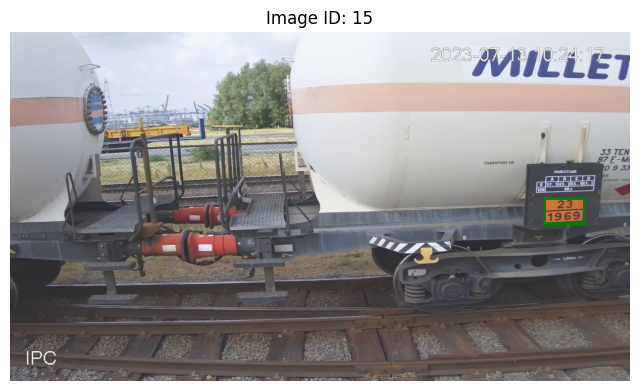

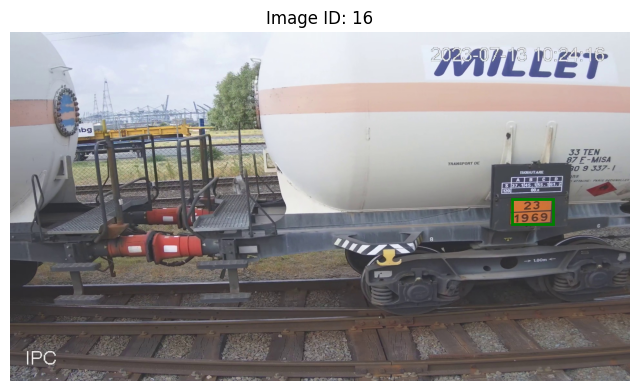

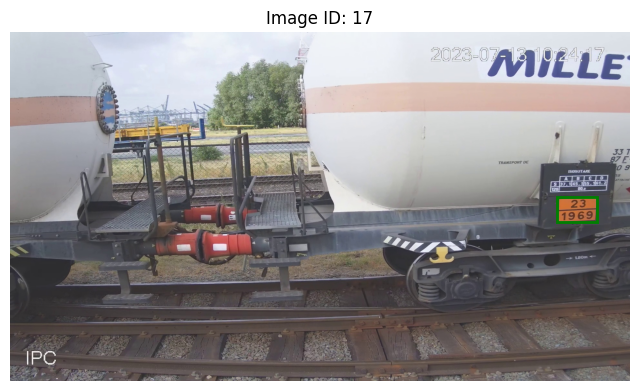

In [52]:
show_bounding_boxes(val_annotations, val_images)

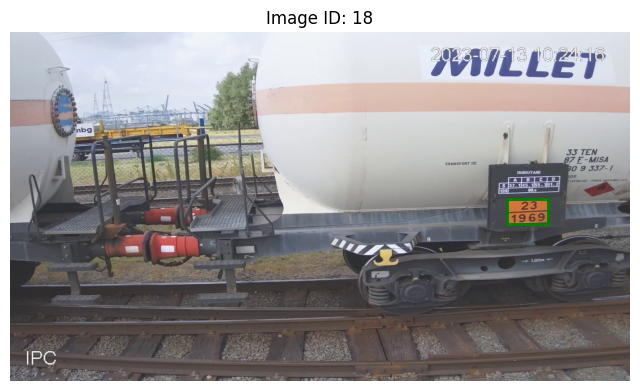

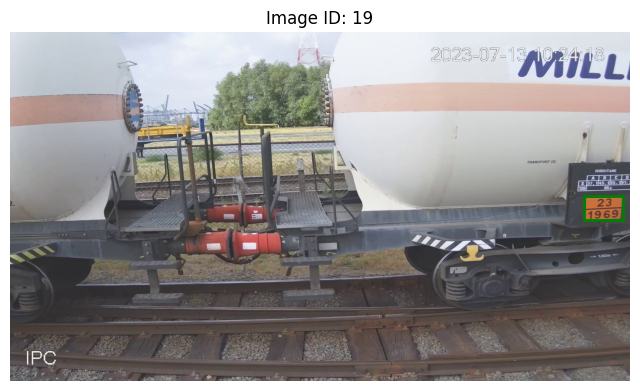

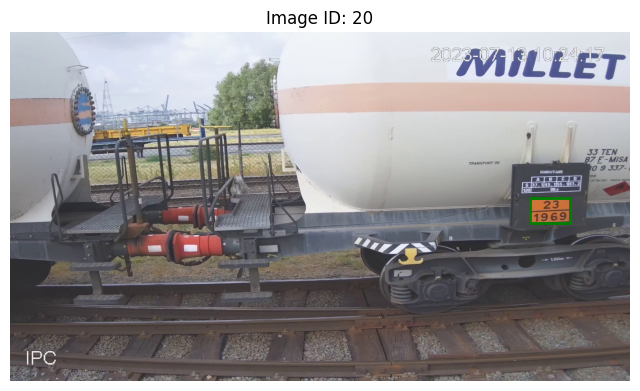

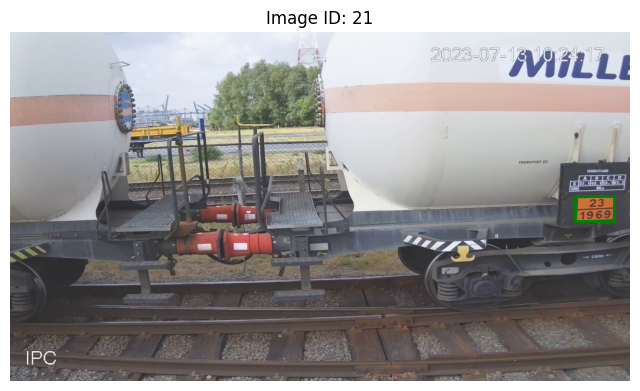

In [51]:
show_bounding_boxes(test_annotations, test_images)

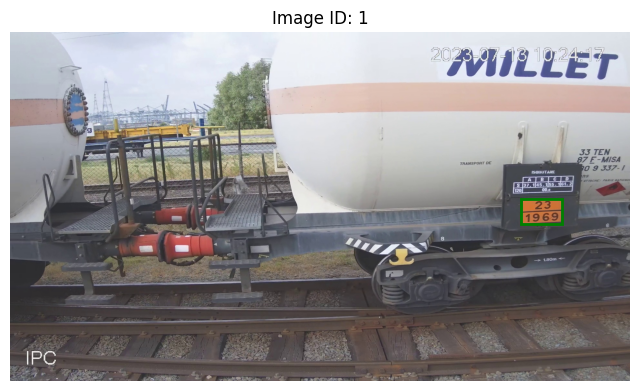

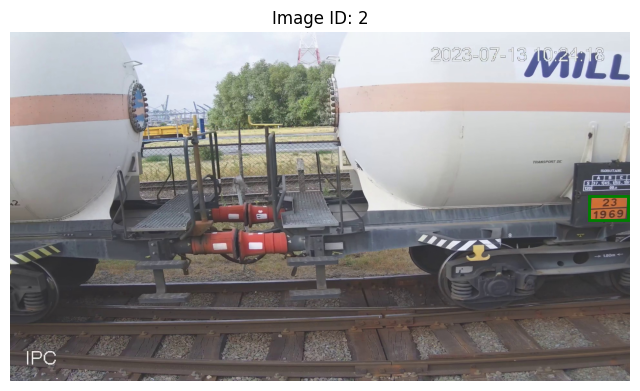

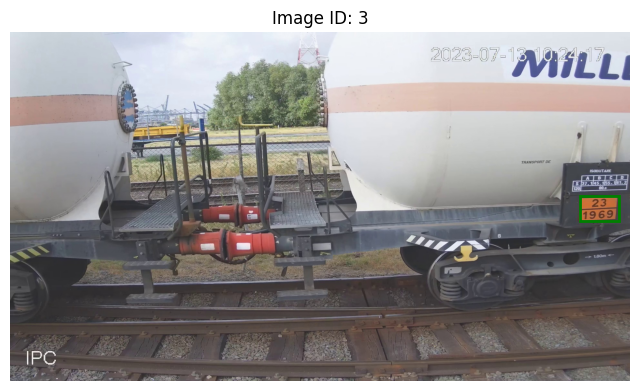

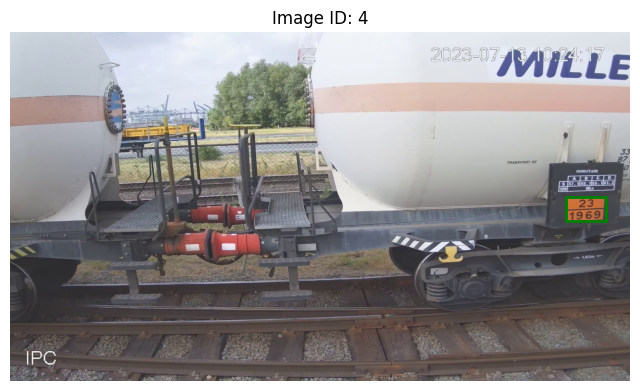

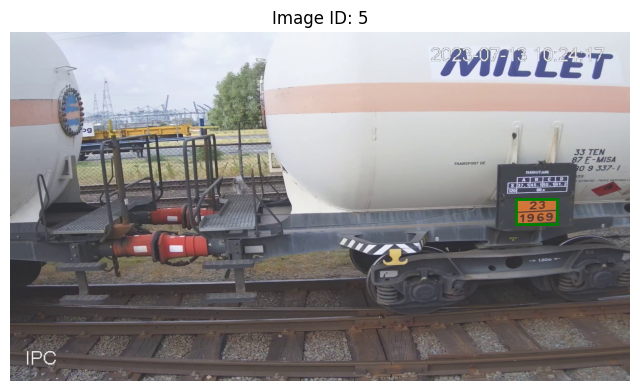

...

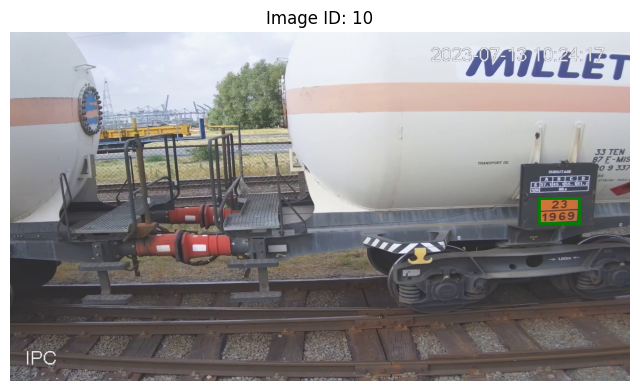

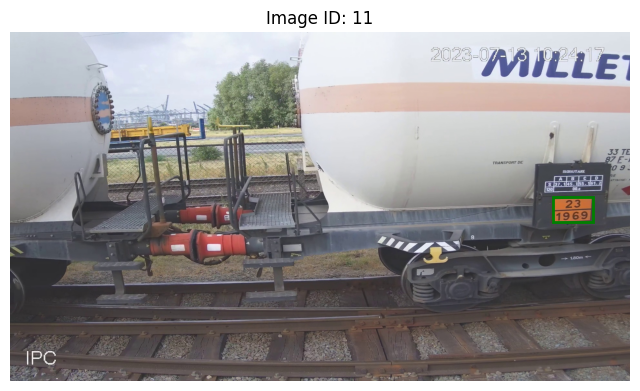

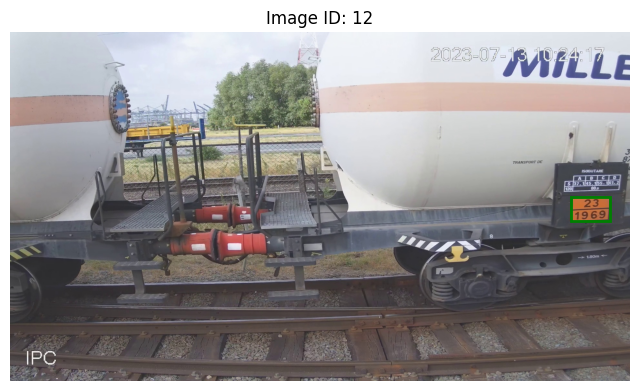

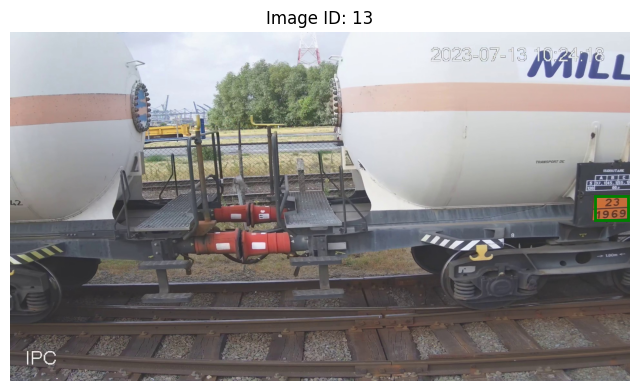

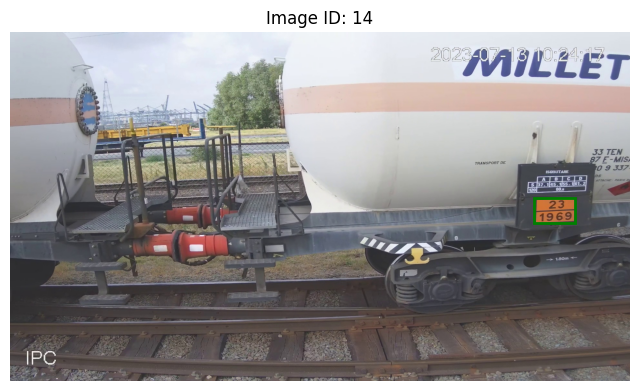

In [50]:
show_bounding_boxes(train_annotations, train_images)

In [55]:
# move the images to /data/data_faster_rcnn/{train, val or test}/images

# loop over train_images and move the images to /data/data_faster_rcnn/train/images


# Define the destination directory
destination_dir_test = "data/data_faster_rcnn/test/images"
destination_dir_val = "data/data_faster_rcnn/val/images"
destination_dir_train = "data/data_faster_rcnn/train/images"

#annotations data directories
destination_dir_test_annotations = "data/data_faster_rcnn/test/annotations"
destination_dir_val_annotations = "data/data_faster_rcnn/val/annotations"
destination_dir_train_annotations = "data/data_faster_rcnn/train/annotations"

# Create the destination directories if it does not exist
os.makedirs(destination_dir_test, exist_ok=True)
os.makedirs(destination_dir_val, exist_ok=True)
os.makedirs(destination_dir_train, exist_ok=True)
os.makedirs(destination_dir_test_annotations, exist_ok=True)
os.makedirs(destination_dir_val_annotations, exist_ok=True)
os.makedirs(destination_dir_train_annotations, exist_ok=True)


def move_images(image_list, destination_dir):
    for image in image_list:
        # Get the source and destination paths
        source_path = os.path.join(path_for_images, image["file_name"])
        destination_path = os.path.join(destination_dir, image["file_name"])
        # Move the image
        shutil.move(source_path, destination_path)

# Move images to the destination directory
move_images(train_images, destination_dir_train)
move_images(val_images, destination_dir_val)
move_images(test_images, destination_dir_test)


In [56]:
# create the annotations files in json
categories_list = [
    {"id": 1, "name": "hazmat code"}
]

# Create the dictionary
data_train = {
    "images": train_images,
    "annotations": train_annotations,
    "categories": categories_list
}

data_val = {
    "images": val_images,
    "annotations": val_annotations,
    "categories": categories_list
}

data_test = {
    "images": test_images,
    "annotations": test_annotations,
    "categories": categories_list
}

# Save the dictionaries as JSON files
def save_json(data, json_path):
    with open(json_path, "w") as file:
        json.dump(data, file)

save_json(data_train, destination_dir_train_annotations + "/instances_train.json")
save_json(data_val, destination_dir_val_annotations + "/instances_val.json")
save_json(data_test, destination_dir_test_annotations + "/instances_test.json")


annotations in train:


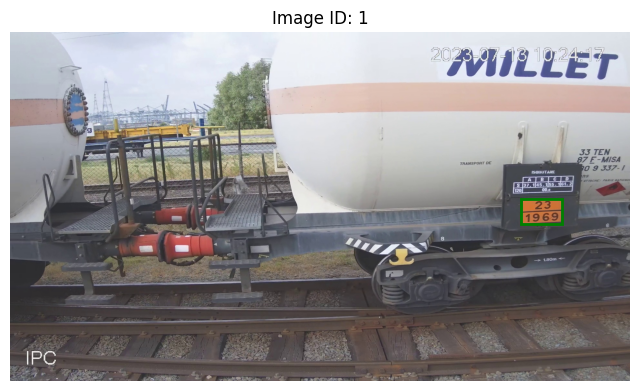

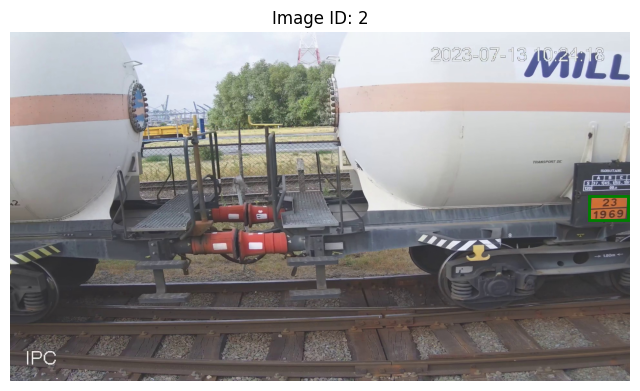

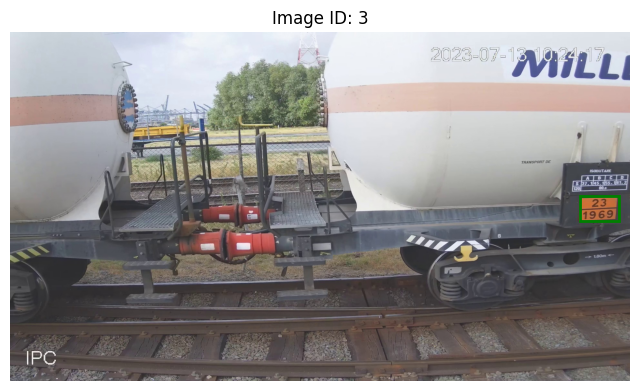

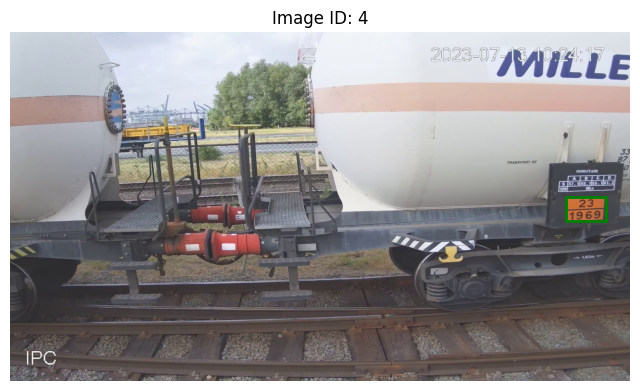

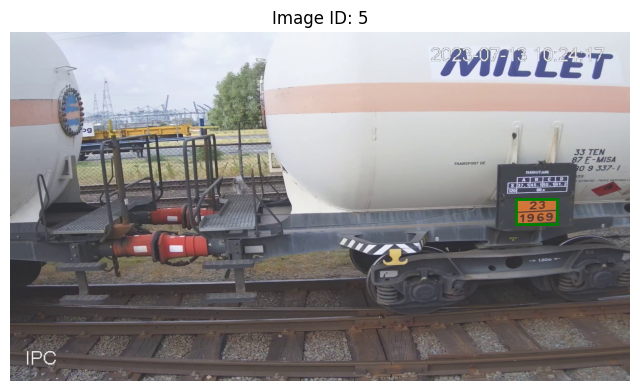

...

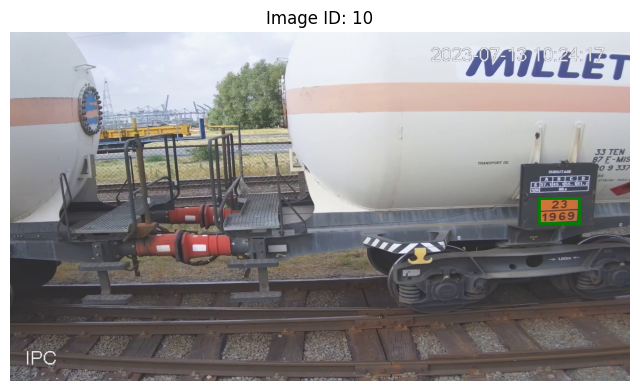

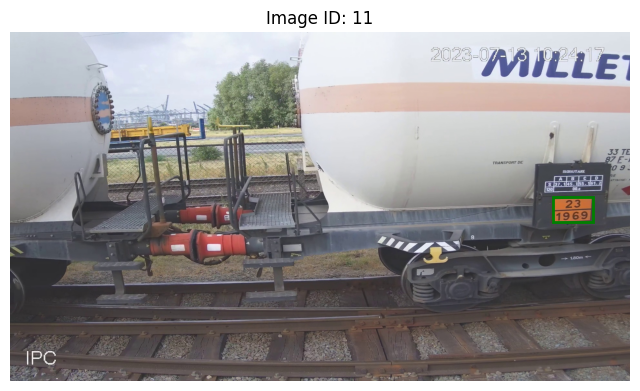

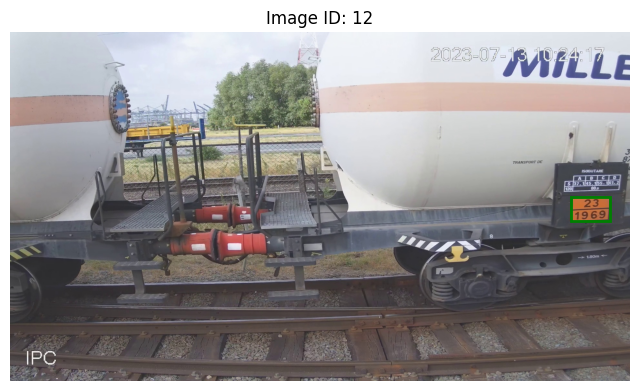

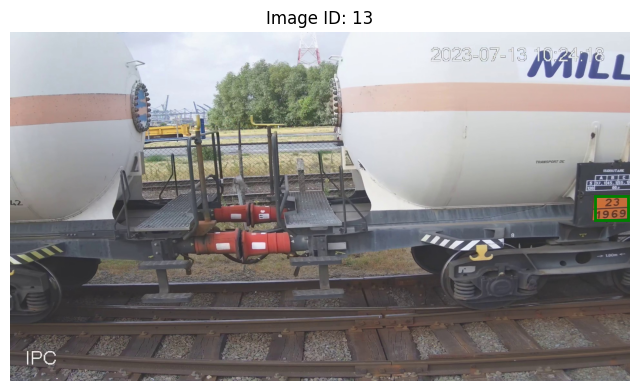

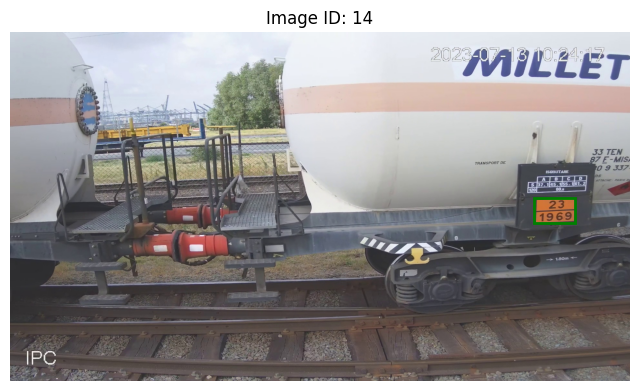

annotations in val:


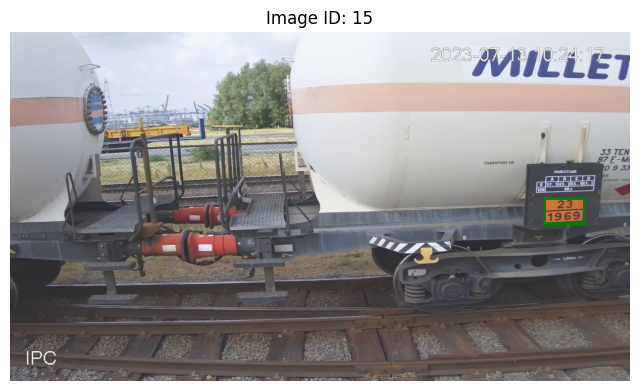

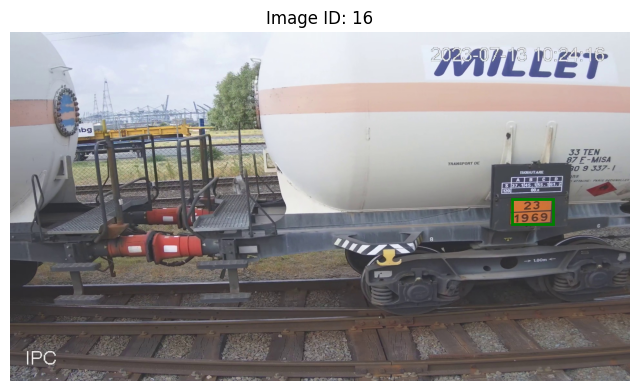

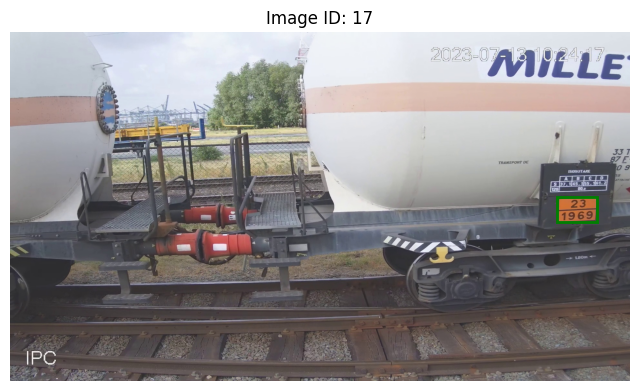

annotations in test:


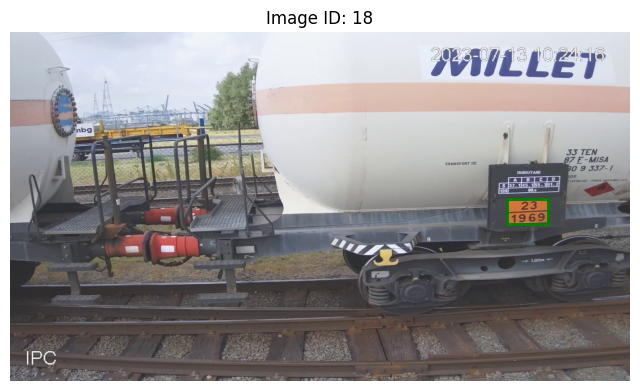

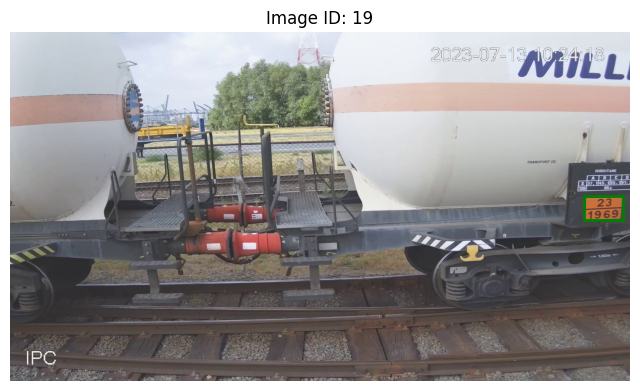

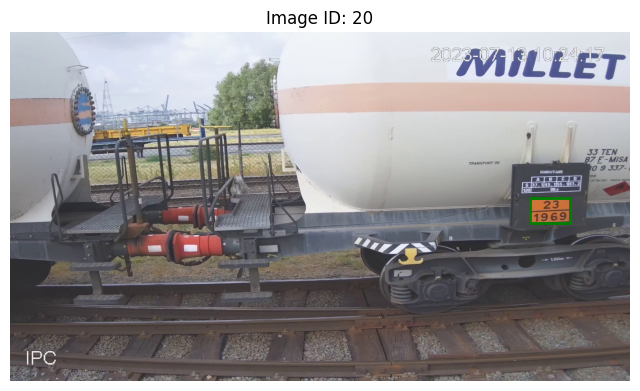

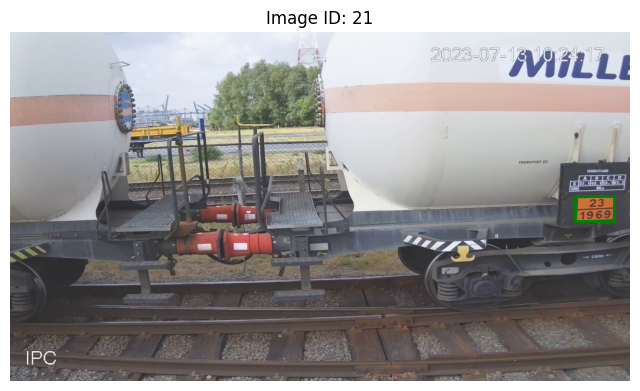

In [62]:
# check if all the images are in the right folder

# read the json files
def check_images_in_annotations(images_json, destination_dir, destination_dir_for_images):
    with open(destination_dir) as f:
        data = json.load(f)
        annotations = data["annotations"]
        for annotation in annotations:
            image_id = annotation["image_id"]
            images = data["images"]
            image = next((image for image in images if image["id"] == image_id), None)

            if image is None:
                print(f"Image not found for annotation: {annotation}")
            else:
                # show the image with bounding box
                # Read the image
                path_im = destination_dir_for_images + "/"+ image["file_name"]
                image = cv2.imread(path_im)
                if image is None:
                    print(f"Image not found: {path_im}")
                    continue

                # Convert BGR (OpenCV format) to RGB (Matplotlib format)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Extract bounding box coordinates
                x, y, w, h = annotation["bbox"]
                x, y, w, h = int(x), int(y), int(w), int(h)

                # Plot the image
                plt.figure(figsize=(8, 8))
                plt.imshow(image)

                # Draw the bounding box
                plt.gca().add_patch(plt.Rectangle((x, y), w, h, edgecolor='green', facecolor='none', linewidth=2))

                # Display the image with the bounding box
                plt.title(f"Image ID: {image_id}")
                plt.axis("off")
                plt.show()

print("annotations in train:")
check_images_in_annotations(data_train, destination_dir_train_annotations+"/instances_train.json", destination_dir_train)

print("annotations in val:")
check_images_in_annotations(data_val, destination_dir_val_annotations+"/instances_val.json", destination_dir_val)

print("annotations in test:")
check_images_in_annotations(data_test, destination_dir_test_annotations+"/instances_test.json", destination_dir_test)

### CODE BELOW IS WORK IN PROGRESS !BROKEN!

In [84]:


from utils.dataset import CocoDataset
# Load pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the classifier for custom classes
num_classes = 2  # 1 class + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Dataset and DataLoader
train_dataset = CocoDataset(root='data/data_faster_rcnn/train/images',
                              annFile='data/data_faster_rcnn/train/annotations/instances_train.json',
                              transform=transforms.ToTensor())

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))


Note: you may need to restart the kernel to use updated packages.
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13936 sha256=e81b8ce2a428ee1fa77e619a54785ff7f2e5f807d6da3f07f60984144ec10cb7
  Stored in directory: c:\users\ewald\appdata\local\pip\cache\wheels\b8\39\f5\9d0ca31dba85773ececf0a7f5469f18810e1c8a8ed9da28ca7
Successfully built utils
Note: you may need to restart the kernel to use updated packages.


ModuleNotFoundError: No module named 'utils.dataset'

In [69]:
train_dataset

Dataset CocoDetection
    Number of datapoints: 14
    Root location: data/data_faster_rcnn/train/images
    StandardTransform
Transform: ToTensor()

In [81]:
train_dataset.get_classnames()

AttributeError: 'CocoDetection' object has no attribute 'get_classnames'

In [73]:
# Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training Loop
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

for epoch in range(10):
    model.train()
    for images, targets in train_loader:
        images = [img.to(device) for img in images]

        # Transform targets to expected format
        processed_targets = []
        for target_list in targets:  # Iterate through each batch
            boxes = []
            labels = []
            for obj in target_list:  # Process each object's annotations
                x_min, y_min, width, height = obj["bbox"]
                x_max = x_min + width
                y_max = y_min + height

                # Ensure the box has valid dimensions
                if width > 0 and height > 0:
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(obj["category_id"])

            # Convert to tensors
            processed_target = {
                "boxes": torch.tensor(boxes, dtype=torch.float32),
                "labels": torch.tensor(labels, dtype=torch.int64),
            }
            processed_targets.append(processed_target)

        targets = [{k: v.to(device) for k, v in t.items()} for t in processed_targets]

        # Forward pass and loss computation
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())


    print(f"Epoch {epoch}, Loss: {losses.item()}")


Epoch 0, Loss: 1.0352821350097656
Epoch 1, Loss: 1.0344630479812622
Epoch 2, Loss: 1.0414433479309082
Epoch 3, Loss: 1.0503230094909668
Epoch 4, Loss: 1.0444495677947998
Epoch 5, Loss: 1.061553716659546
Epoch 6, Loss: 1.085394263267517
Epoch 7, Loss: 1.0300111770629883
Epoch 8, Loss: 1.0484620332717896
Epoch 9, Loss: 1.0295648574829102


In [76]:
path

'C:\\Users\\ewald\\.cache\\kagglehub\\datasets\\stanislavlevendeev\\hazmat-detection\\versions\\11'

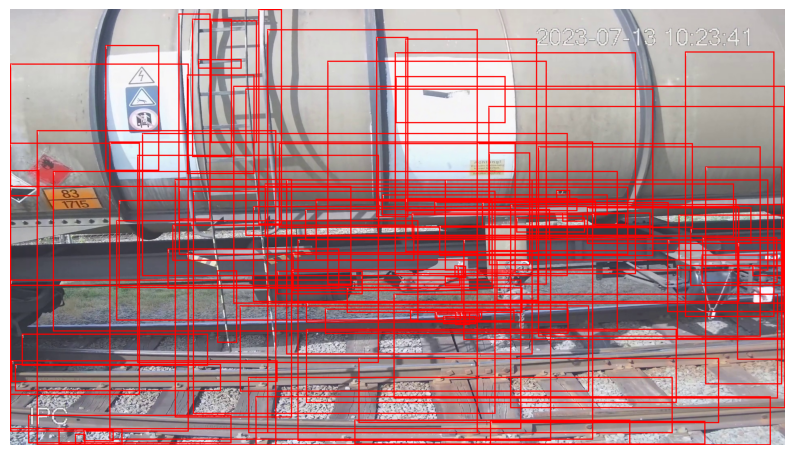

In [77]:


# Function to visualize the bounding boxes on the image
def visualize_predictions(image_path, model, device, threshold=0.5):
    # Load image and apply the necessary transformations (to tensor)
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Run the model to get predictions
    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)

    # Get the predicted boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']

    # Filter out boxes with low scores
    boxes = boxes[scores > threshold]
    labels = labels[scores > threshold]
    
    # Draw the boxes on the image
    draw = ImageDraw.Draw(image)
    
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box.tolist()  # Convert box to list for easy manipulation
        draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)
        draw.text((x_min, y_min), str(label.item()), fill="white")
    
    # Show the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
image_path = path + '/yolo/images/train/1690281365_00053.jpg'
visualize_predictions(image_path, model, device)


hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazm

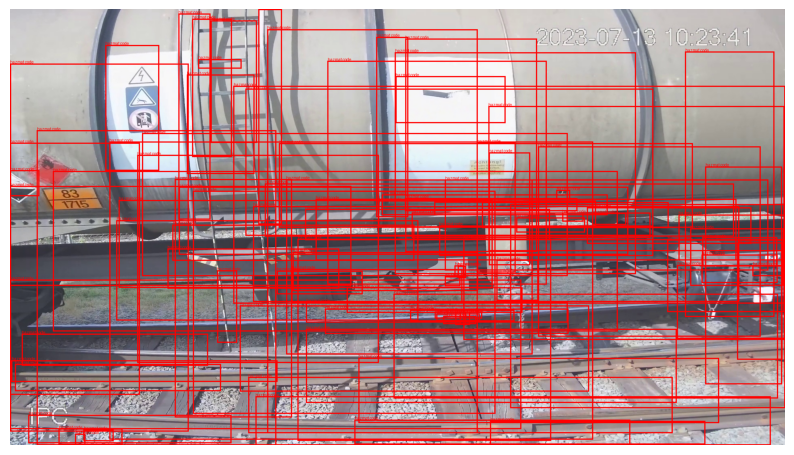

In [80]:
import torch
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# Function to visualize the bounding boxes for a specific category and print labels
def visualize_predictions(image_path, model, device, target_category_id, category_names, threshold=0.5):
    # Load image and apply the necessary transformations (to tensor)
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Run the model to get predictions
    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)

    # Get the predicted boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']
    # Filter out boxes that belong to the target category and have a score above the threshold
    target_boxes = []
    target_labels = []
    for box, label, score in zip(boxes, labels, scores):
        if label.item() == target_category_id and score > threshold:
            target_boxes.append(box)
            target_labels.append(label)

    # Draw the boxes and labels on the image
    draw = ImageDraw.Draw(image)
    
    for box, label in zip(target_boxes, target_labels):
        x_min, y_min, x_max, y_max = box.tolist()  # Convert box to list for easy manipulation
        draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)
        
        # Get the label name (use category_names dictionary)
        label_name = category_names.get(label.item(), "Unknown")
        print(label_name)
        # Draw the label text next to the bounding box
        draw.text((x_min, y_min - 10), label_name, fill="red")  # Adjust the position as needed
    
    # Show the image with bounding boxes and labels
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
target_category_id = 1  # Replace with the category ID you're interested in (e.g., 1 for "person")

# Define category names (this can be a dictionary with category ID to name mappings)
category_names = {1: "hazmat code", 2: "bicycle", 3: "car", 4: "dog", 5: "cat"}  # Modify based on your dataset

visualize_predictions(image_path, model, device, target_category_id, category_names)
